In [58]:
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px
import dash
from dash import dcc, html
from dash.dependencies import Input, Output

# Loading CSV files
demographic_data = pd.read_csv('demographic_data.csv')
academic_data = pd.read_csv('academic_data.csv')
enrollment_data = pd.read_csv('enrollment_data.csv')
behavioral_data = pd.read_csv('behavioral_data.csv')
feedback_data = pd.read_csv('feedback_data.csv')

# Merging dataframes based on student ID
merged_data = pd.merge(demographic_data, academic_data, on='Student_ID', how='inner')
merged_data = pd.merge(merged_data, enrollment_data, on='Student_ID', how='inner')
merged_data = pd.merge(merged_data, behavioral_data, on='Student_ID', how='inner')
merged_data = pd.merge(merged_data, feedback_data, on='Student_ID', how='inner')


In [59]:
print(merged_data.head())

                             Student_ID  Age  Gender Grade_Level  Math_Grade  \
0  dd89819c-c803-46fd-90c0-5d077f388d87   24    Male    Freshman   79.805861   
1  2db28777-6da3-43c0-be5d-8d0511272e30   21    Male      Junior   79.223463   
2  69f27f94-99a5-4e2b-b4c6-bf5ac5aeb200   22  Female      Junior   83.696311   
3  837b56d3-430b-4d68-82d2-99c0489ecebd   24    Male      Junior   92.987239   
4  a9ec2254-34d3-4d7a-9c4a-808ac60ff9ab   20  Female      Senior   73.912368   

   Science_Grade  English_Grade  History Grade  Geography Grade  \
0      89.516696      63.188603      85.050371        72.916043   
1      80.857961      87.324571      86.762141        79.250958   
2      62.738349      97.302668      65.051339        84.694170   
3      74.844518      83.026610      97.831060        76.196433   
4      96.830664      65.044613      65.302963        67.934902   

   Economics Grade  ...  Course_Enrollment  Class_Schedule  \
0        95.999331  ...                 IT         Mor

In [60]:
print(merged_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 26 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Student_ID                      2000 non-null   object 
 1   Age                             2000 non-null   int64  
 2   Gender                          2000 non-null   object 
 3   Grade_Level                     2000 non-null   object 
 4   Math_Grade                      2000 non-null   float64
 5   Science_Grade                   2000 non-null   float64
 6   English_Grade                   2000 non-null   float64
 7   History Grade                   2000 non-null   float64
 8   Geography Grade                 2000 non-null   float64
 9   Economics Grade                 2000 non-null   float64
 10  Art Grade                       2000 non-null   float64
 11  IT Grade                        2000 non-null   float64
 12  Standardized_Test_Score         20

In [61]:
print(merged_data.describe())

               Age   Math_Grade  Science_Grade  English_Grade  History Grade  \
count  2000.000000  2000.000000    2000.000000    2000.000000    2000.000000   
mean     20.967000    80.064091      79.678181      79.846471      79.455866   
std       2.014433    11.594358      11.436616      11.594378      11.306295   
min      18.000000    60.000465      60.001229      60.009640      60.009717   
25%      19.000000    70.242608      69.659984      69.743114      69.910034   
50%      21.000000    80.263730      79.520240      79.489147      79.241346   
75%      23.000000    89.961308      89.527195      90.152543      88.708144   
max      24.000000    99.976549      99.982308      99.978427      99.956188   

       Geography Grade  Economics Grade    Art Grade     IT Grade  \
count      2000.000000      2000.000000  2000.000000  2000.000000   
mean         80.090686        79.997493    79.828409    80.291307   
std          11.417412        11.719697    11.648267    11.550757   
min

In [62]:
# checking for missing values
print("\nMissing Values in Merged Data:")
print(merged_data.isnull().sum())


Missing Values in Merged Data:
Student_ID                        0
Age                               0
Gender                            0
Grade_Level                       0
Math_Grade                        0
Science_Grade                     0
English_Grade                     0
History Grade                     0
Geography Grade                   0
Economics Grade                   0
Art Grade                         0
IT Grade                          0
Standardized_Test_Score           0
Attendance_Rate                   0
Study_Time_Hours                  0
Assignment_Completion_Rate        0
Course_Enrollment                 0
Class_Schedule                    0
Extracurricular_Participation     0
Disciplinary_Incidents            0
Interactions_with_Peers           0
Participation_in_Events           0
Engagement_in_Extracurriculars    0
Student_Feedback_Score            0
Teacher_Feedback_Score            0
Parent_Feedback_Score             0
dtype: int64


In [63]:
# Dropping unnecessary columns
merged_data = merged_data.drop(['Student_ID'], axis=1)


In [64]:
from sklearn.preprocessing import LabelEncoder

# Encoding categorical variables using Label Encoding
le = LabelEncoder()
merged_data['Gender'] = le.fit_transform(merged_data['Gender'])
merged_data['Grade_Level'] = le.fit_transform(merged_data['Grade_Level'])
merged_data['Course_Enrollment'] = le.fit_transform(merged_data['Course_Enrollment'])
merged_data['Class_Schedule'] = le.fit_transform(merged_data['Class_Schedule'])
merged_data['Extracurricular_Participation'] = le.fit_transform(merged_data['Extracurricular_Participation'])


In [65]:
print(merged_data.head())

   Age  Gender  Grade_Level  Math_Grade  Science_Grade  English_Grade  \
0   24       1            0   79.805861      89.516696      63.188603   
1   21       1            1   79.223463      80.857961      87.324571   
2   22       0            1   83.696311      62.738349      97.302668   
3   24       1            1   92.987239      74.844518      83.026610   
4   20       0            2   73.912368      96.830664      65.044613   

   History Grade  Geography Grade  Economics Grade  Art Grade  ...  \
0      85.050371        72.916043        95.999331  60.171270  ...   
1      86.762141        79.250958        87.526977  95.417551  ...   
2      65.051339        84.694170        99.438973  62.659632  ...   
3      97.831060        76.196433        90.680501  98.121863  ...   
4      65.302963        67.934902        97.678977  71.273027  ...   

   Course_Enrollment  Class_Schedule  Extracurricular_Participation  \
0                  5               2                              0  

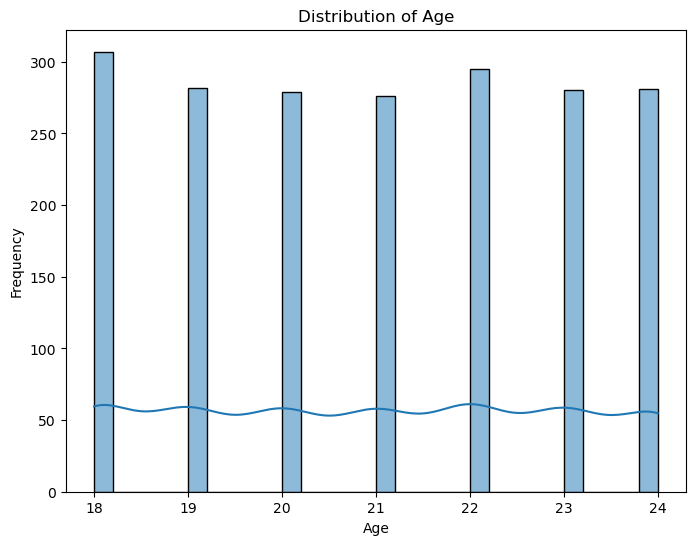

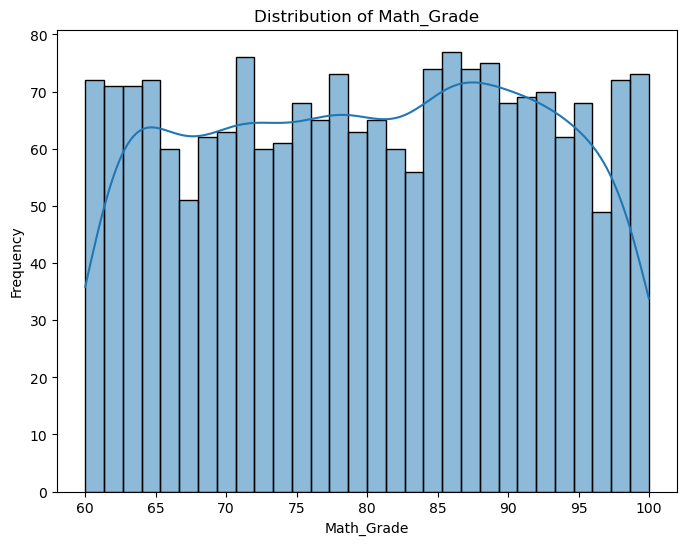

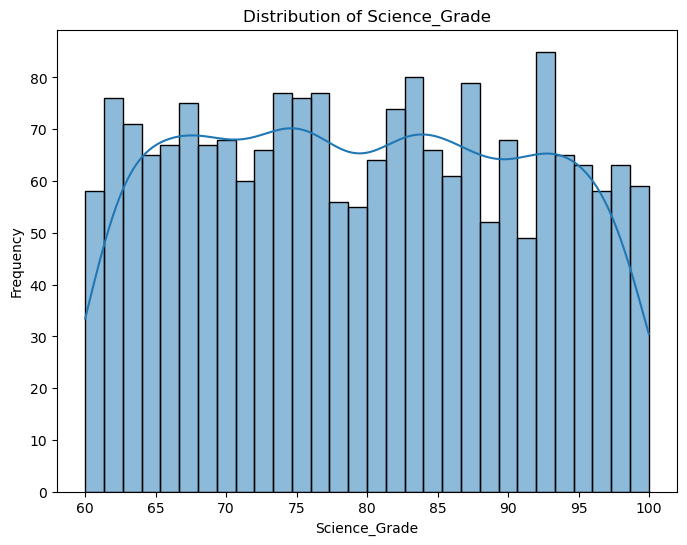

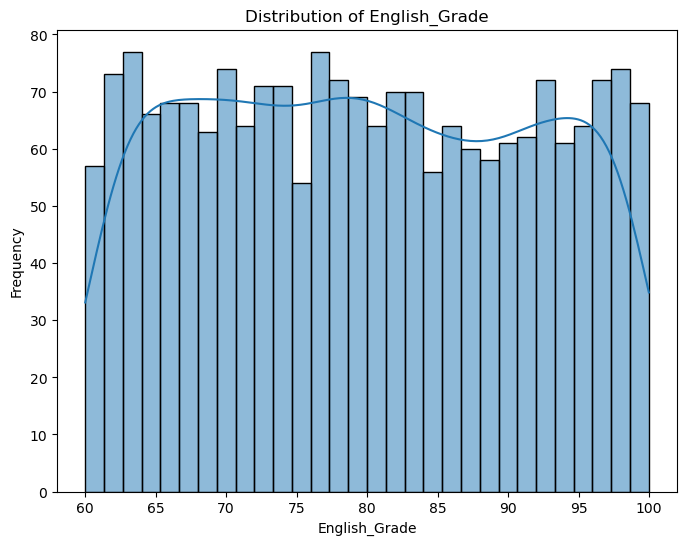

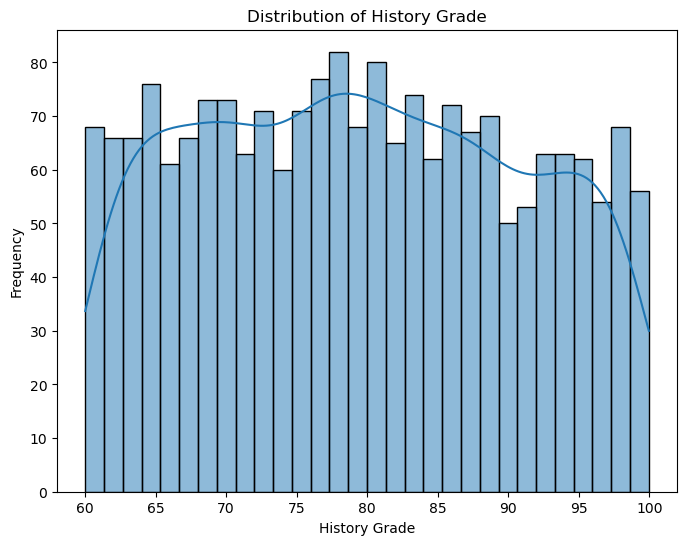

...

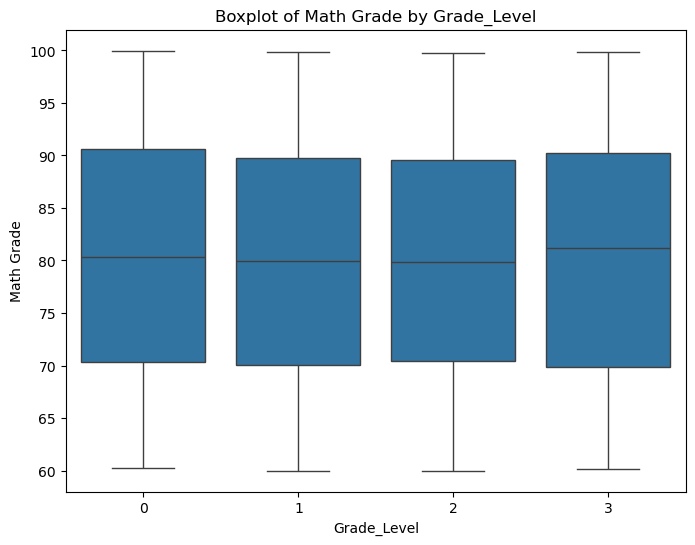

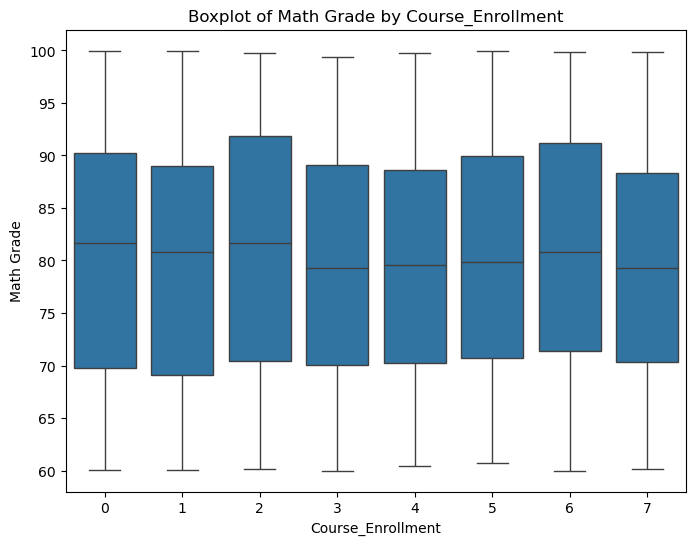

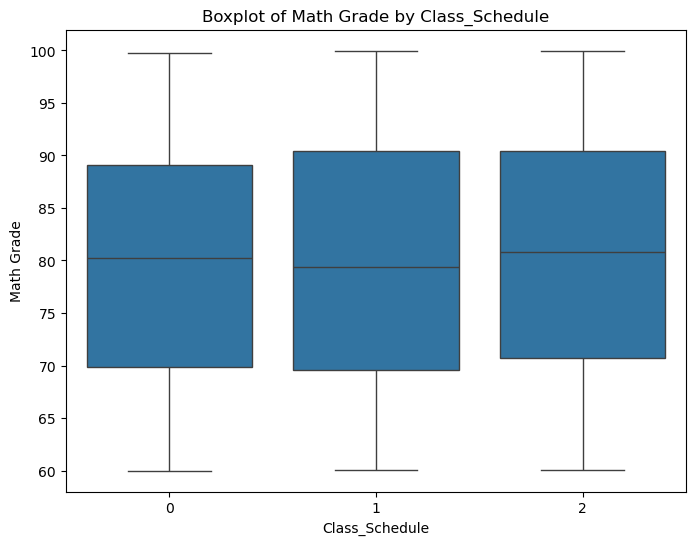

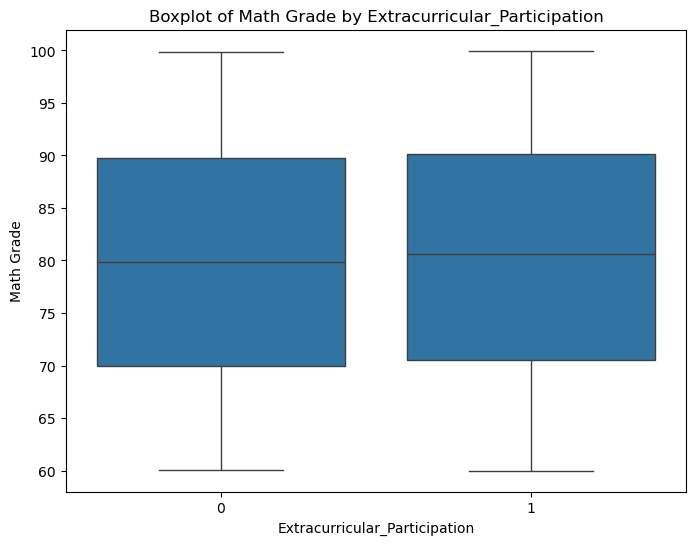

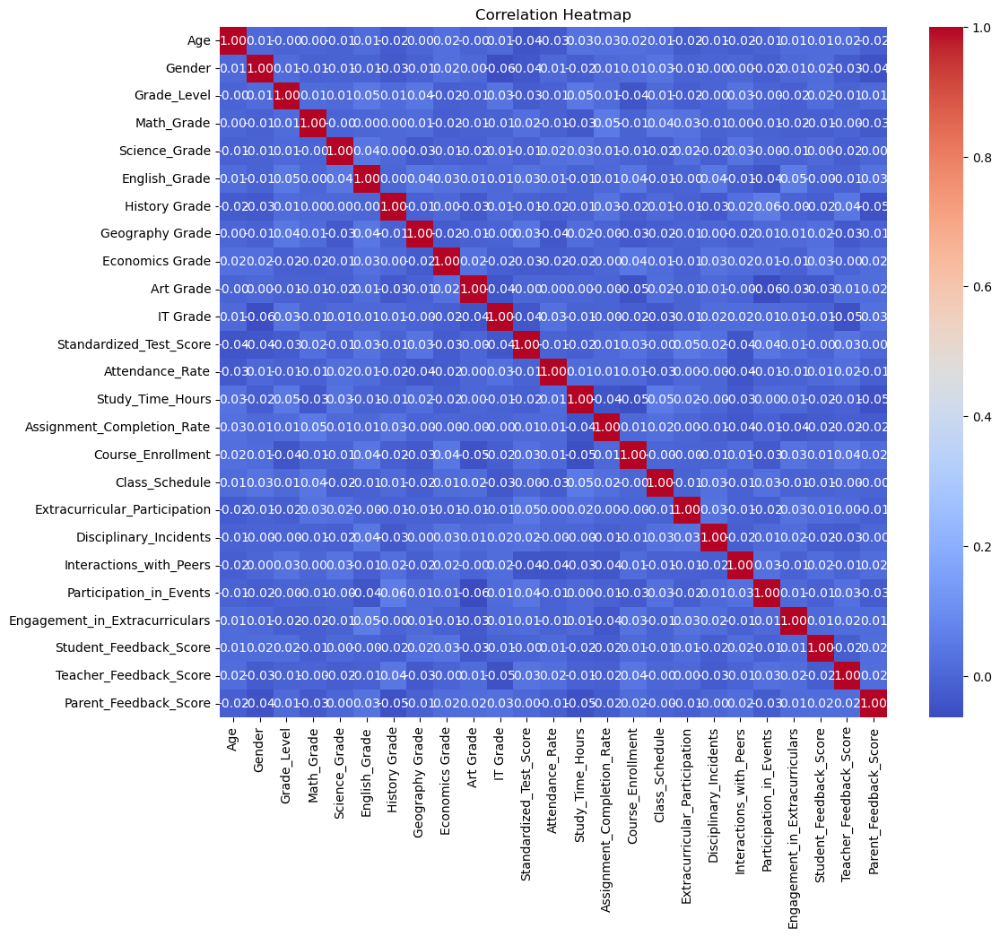

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# histograms for numerical features
numerical_features = ['Age', 'Math_Grade', 'Science_Grade', 'English_Grade', 'History Grade']
for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(merged_data[feature], bins=30, kde=True)
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()

# boxplots for categorical features
categorical_features = ['Gender', 'Grade_Level', 'Course_Enrollment', 'Class_Schedule', 'Extracurricular_Participation']
for feature in categorical_features:
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=feature, y='Math_Grade', data=merged_data)
    plt.title(f'Boxplot of Math Grade by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Math Grade')
    plt.show()

# correlations between features
correlation_matrix = merged_data.corr()
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap')
plt.show()


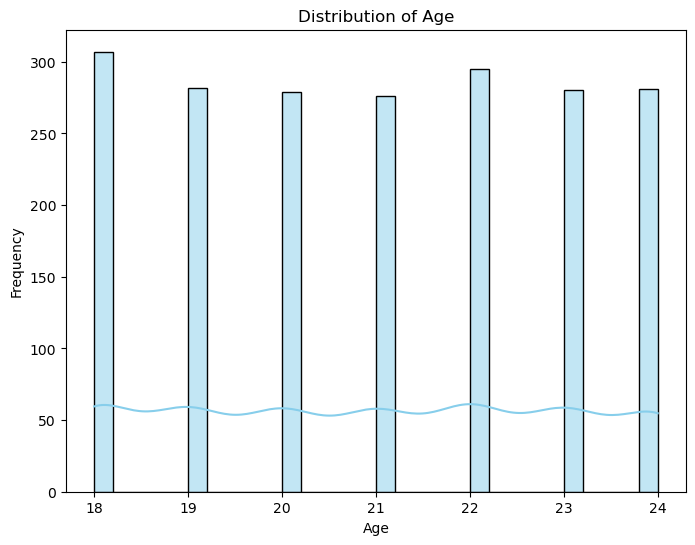

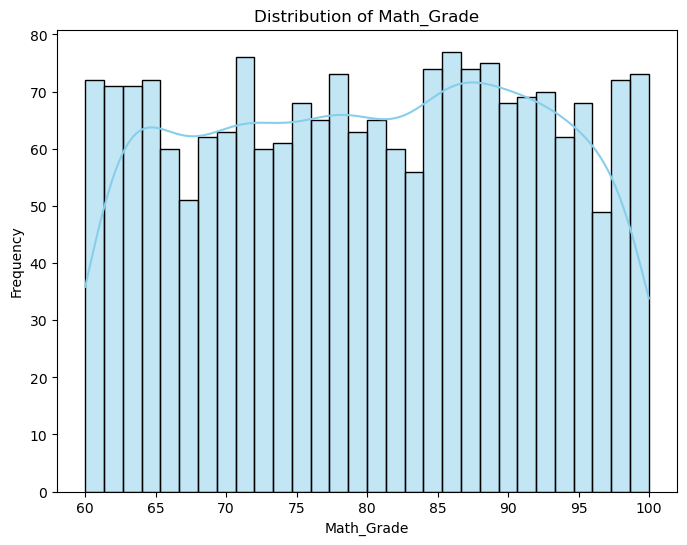

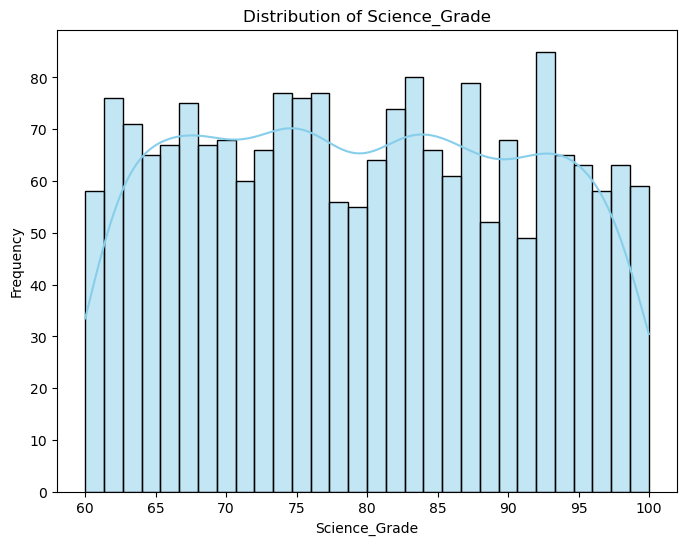

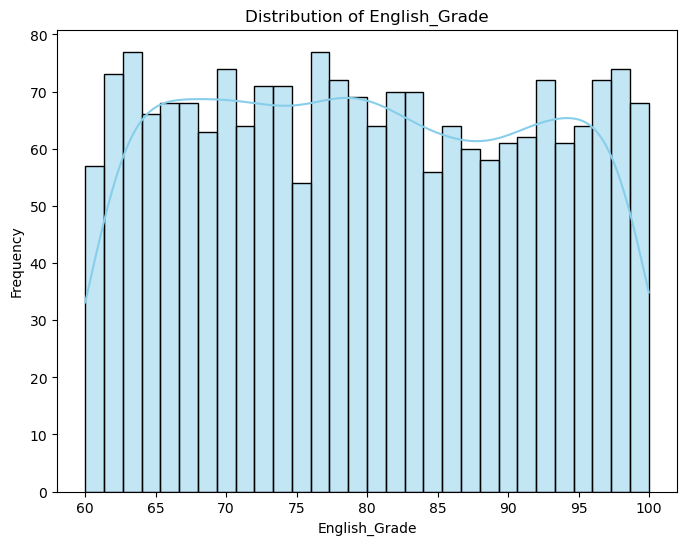

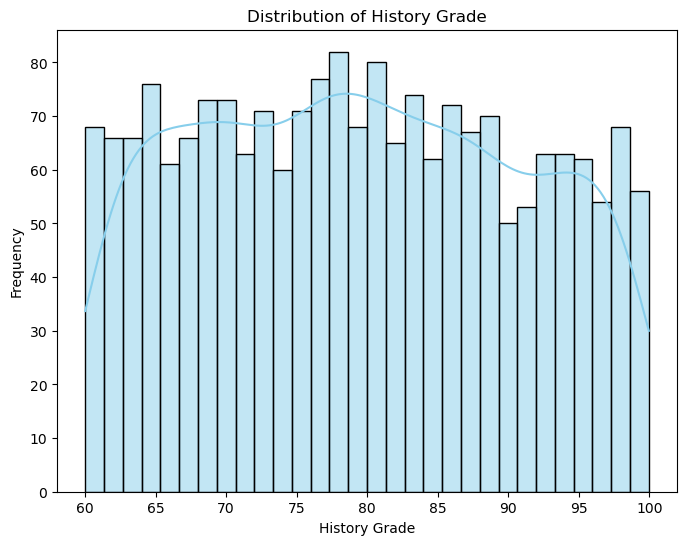

...

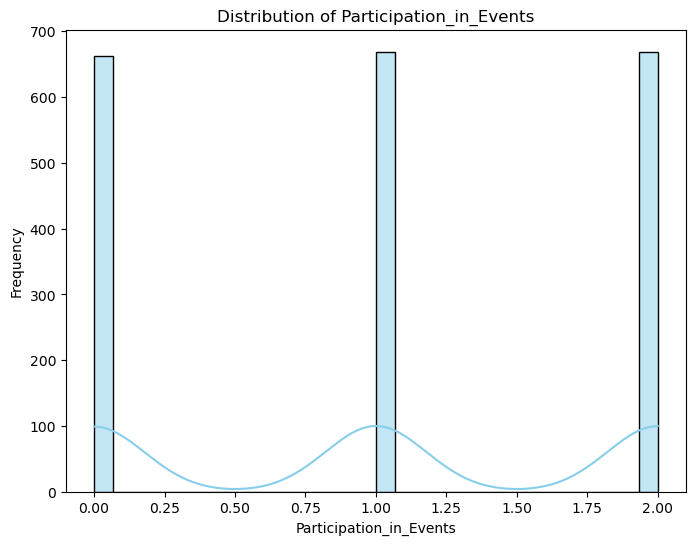

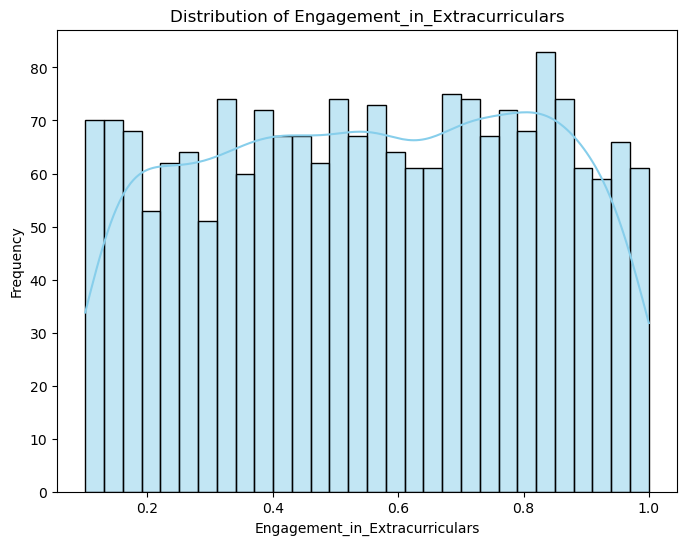

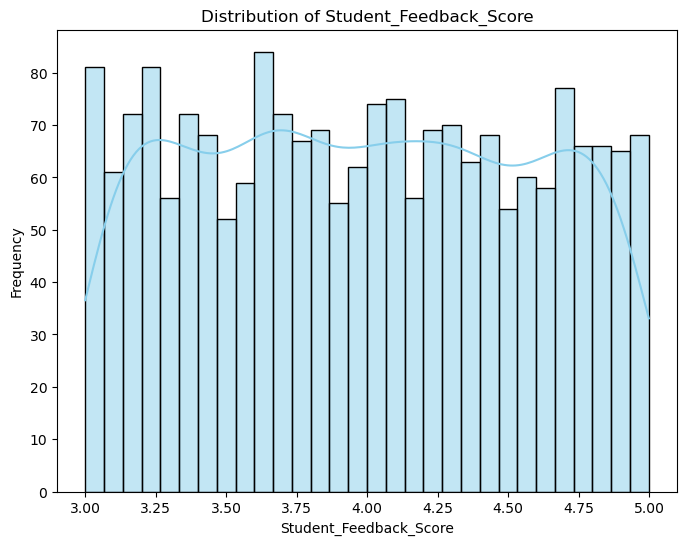

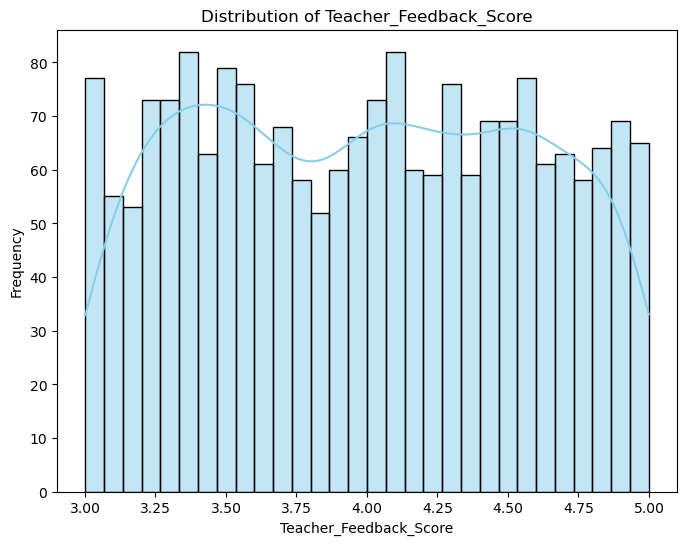

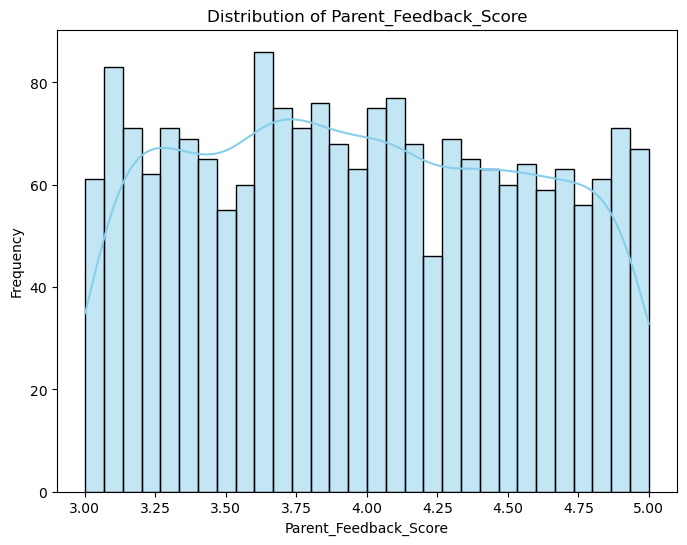

In [67]:


# histograms for all numerical features
numerical_features = merged_data.select_dtypes(include=['int64', 'float64']).columns

for feature in numerical_features:
    plt.figure(figsize=(8, 6))
    sns.histplot(merged_data[feature], bins=30, kde=True, color='skyblue')  
    plt.title(f'Distribution of {feature}')
    plt.xlabel(feature)
    plt.ylabel('Frequency')
    plt.show()



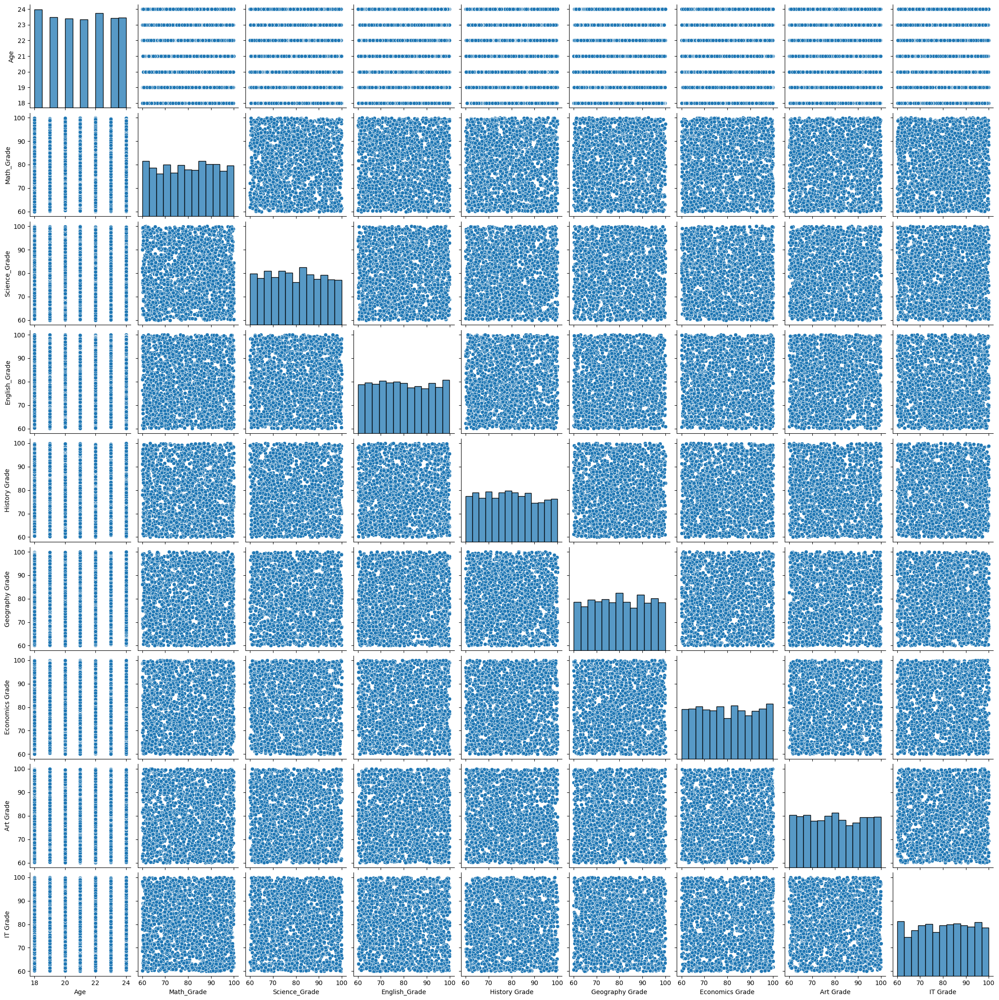

In [68]:
# pair plots for selected numerical features
selected_numerical_features = ['Age', 'Math_Grade', 'Science_Grade', 'English_Grade', 'History Grade', 'Geography Grade','Economics Grade','Art Grade','IT Grade']
sns.pairplot(merged_data[selected_numerical_features])
plt.show()


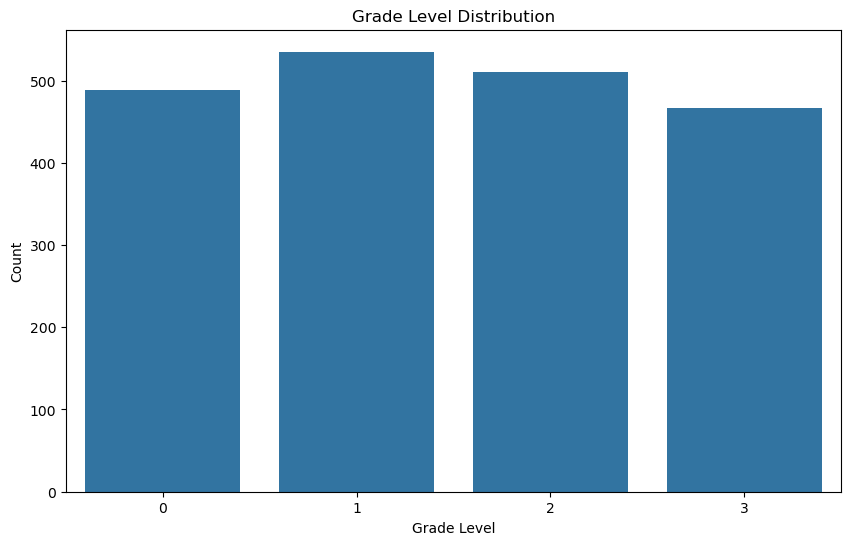

In [69]:
# Bar chart for grade level distribution
grade_level_distribution = merged_data['Grade_Level'].value_counts().sort_index()

plt.figure(figsize=(10, 6))
sns.barplot(x=grade_level_distribution.index, y=grade_level_distribution.values)
plt.title('Grade Level Distribution')
plt.xlabel('Grade Level')
plt.ylabel('Count')
plt.show()


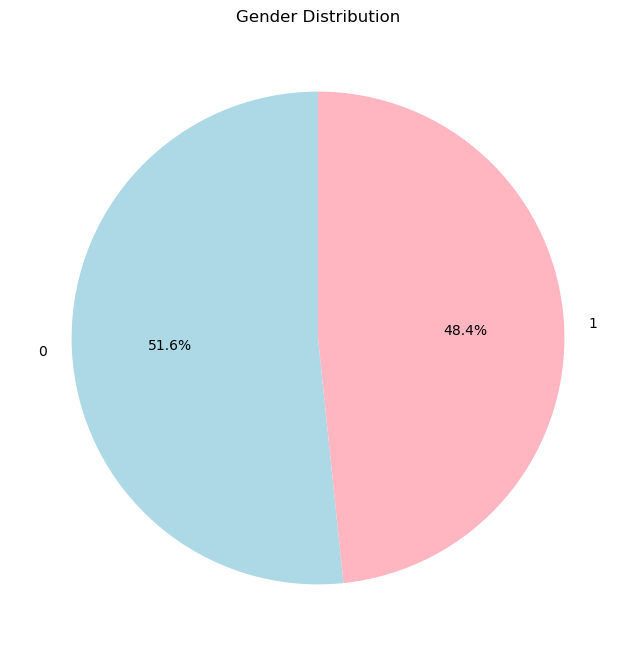

In [70]:
# Pie chart for gender distribution
gender_distribution = merged_data['Gender'].value_counts()
labels = gender_distribution.index
sizes = gender_distribution.values

plt.figure(figsize=(8, 8))
plt.pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightpink'])
plt.title('Gender Distribution')
plt.show()


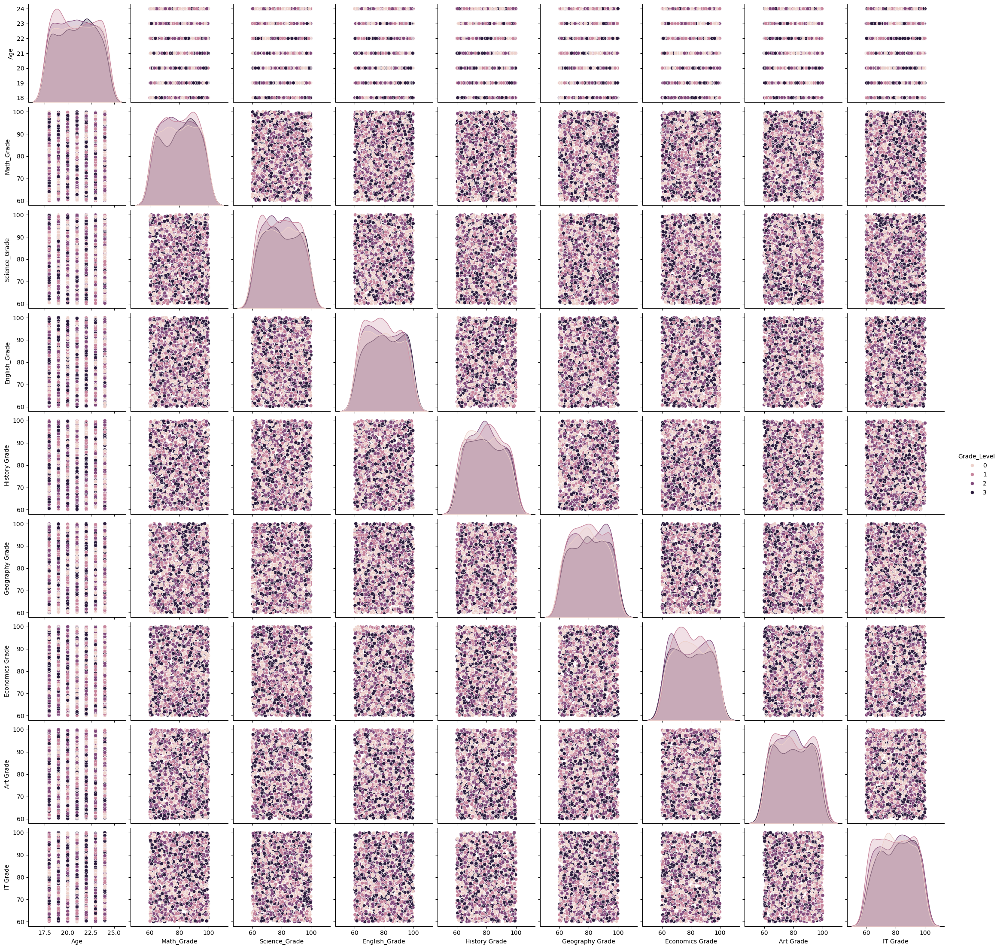

In [71]:
# Pair plots with color coded grade level
pairplot_data_grade = merged_data[selected_numerical_features + ['Grade_Level']]
sns.pairplot(pairplot_data_grade, hue='Grade_Level', diag_kind='kde')
plt.show()


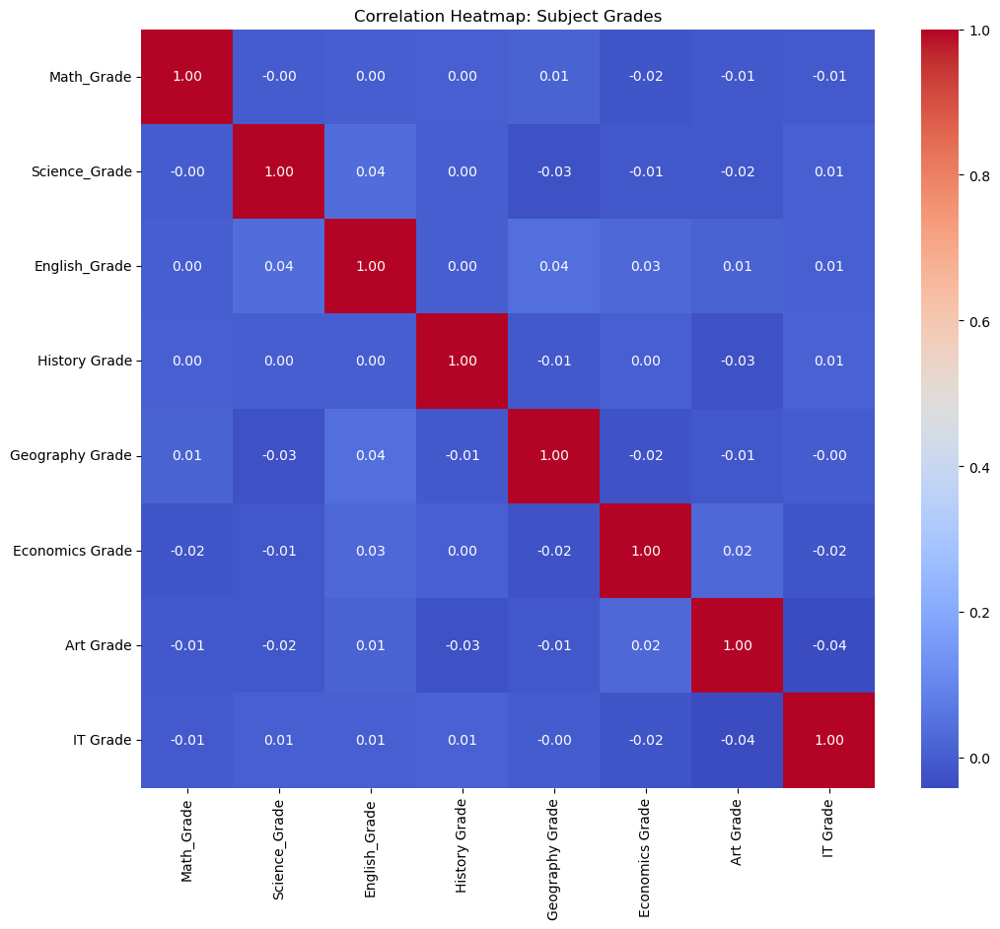

In [72]:
# Heatmap for subject grades
subject_grades = merged_data[['Math_Grade', 'Science_Grade', 'English_Grade', 'History Grade', 'Geography Grade', 'Economics Grade', 'Art Grade', 'IT Grade']]

plt.figure(figsize=(12, 10))
sns.heatmap(subject_grades.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Heatmap: Subject Grades')
plt.show()


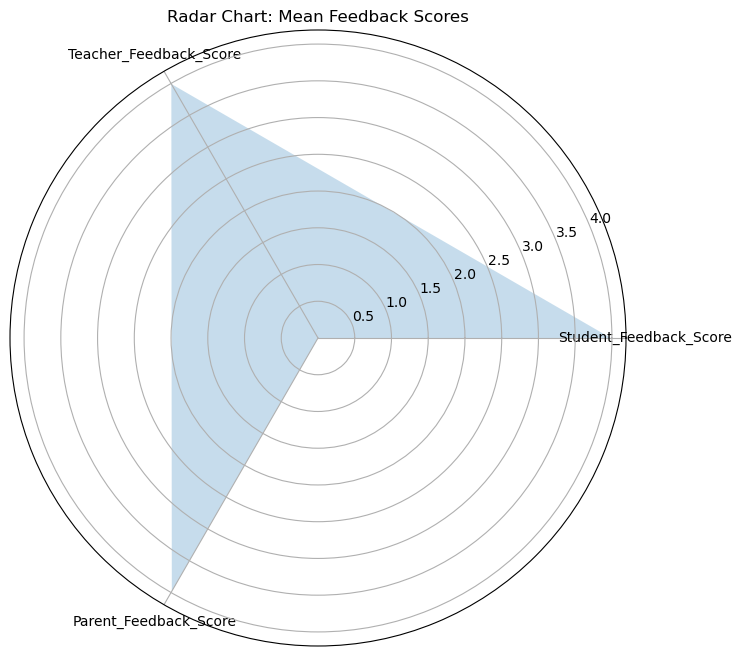

In [73]:
import numpy as np

# Feedback scores and their mean values
feedback_scores = ['Student_Feedback_Score', 'Teacher_Feedback_Score', 'Parent_Feedback_Score']
mean_feedback_scores = merged_data[feedback_scores].mean()

# Number of feedback scores
num_feedback_scores = len(feedback_scores)

# Creating a list of evenly spaced angles for radar chart
theta = np.linspace(0, 2*np.pi, num_feedback_scores, endpoint=False)

# radar chart
plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)
ax.fill_between(theta, mean_feedback_scores, alpha=0.25)
ax.set_xticks(theta)
ax.set_xticklabels(feedback_scores)
plt.title('Radar Chart: Mean Feedback Scores')
plt.show()

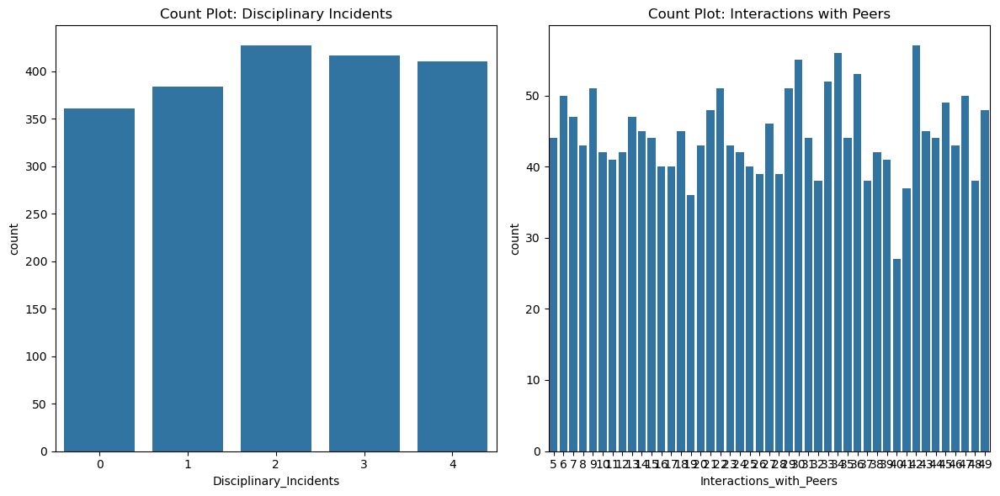

In [74]:
# Count plots for disciplinary incidents and interactions with peers
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.countplot(x='Disciplinary_Incidents', data=merged_data)
plt.title('Count Plot: Disciplinary Incidents')

plt.subplot(1, 2, 2)
sns.countplot(x='Interactions_with_Peers', data=merged_data)
plt.title('Count Plot: Interactions with Peers')

plt.tight_layout()
plt.show()


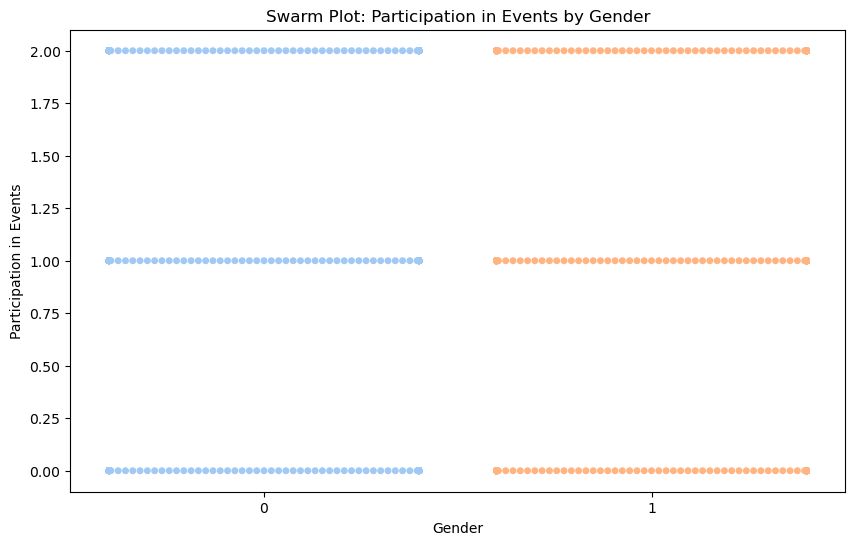

In [75]:
# Swarm plot for participation in events by gender
plt.figure(figsize=(10, 6))
sns.swarmplot(x='Gender', y='Participation_in_Events', data=merged_data, palette='pastel')
plt.title('Swarm Plot: Participation in Events by Gender')
plt.xlabel('Gender')
plt.ylabel('Participation in Events')
plt.show()


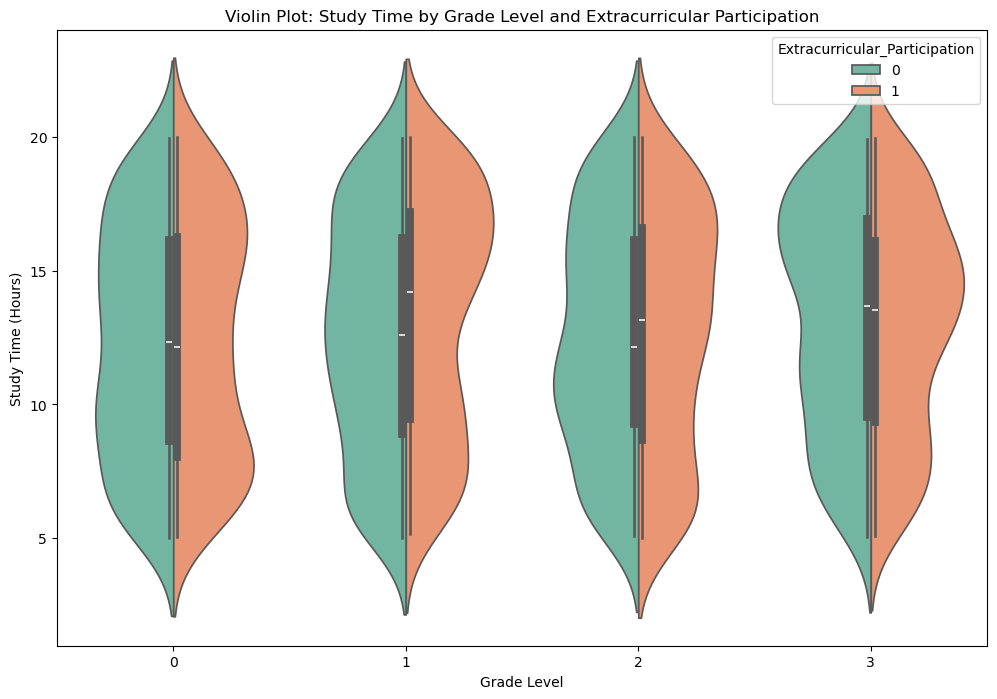

In [76]:
# Violin plot for study time by grade level and extracurricular participation
plt.figure(figsize=(12, 8))
sns.violinplot(x='Grade_Level', y='Study_Time_Hours', hue='Extracurricular_Participation', data=merged_data, split=True, palette='Set2')
plt.title('Violin Plot: Study Time by Grade Level and Extracurricular Participation')
plt.xlabel('Grade Level')
plt.ylabel('Study Time (Hours)')
plt.show()


In [77]:
# Feature Engineering 

# Creating new feature: Average_Grade
merged_data['Average_Grade'] = merged_data[['Math_Grade', 'Science_Grade', 'English_Grade', 'History Grade', 'Geography Grade', 'Economics Grade', 'Art Grade', 'IT Grade']].mean(axis=1)

# Displaying updated DataFrame
print(merged_data.head())


   Age  Gender  Grade_Level  Math_Grade  Science_Grade  English_Grade  \
0   24       1            0   79.805861      89.516696      63.188603   
1   21       1            1   79.223463      80.857961      87.324571   
2   22       0            1   83.696311      62.738349      97.302668   
3   24       1            1   92.987239      74.844518      83.026610   
4   20       0            2   73.912368      96.830664      65.044613   

   History Grade  Geography Grade  Economics Grade  Art Grade  ...  \
0      85.050371        72.916043        95.999331  60.171270  ...   
1      86.762141        79.250958        87.526977  95.417551  ...   
2      65.051339        84.694170        99.438973  62.659632  ...   
3      97.831060        76.196433        90.680501  98.121863  ...   
4      65.302963        67.934902        97.678977  71.273027  ...   

   Class_Schedule  Extracurricular_Participation  Disciplinary_Incidents  \
0               2                              0                

In [78]:
# Defining threshold for success
grade_threshold = 75

# Creating binary target variable: Success
merged_data['Success'] = (merged_data['Average_Grade'] >= grade_threshold).astype(int)

# Displaying updated DataFrame
print(merged_data.head())


   Age  Gender  Grade_Level  Math_Grade  Science_Grade  English_Grade  \
0   24       1            0   79.805861      89.516696      63.188603   
1   21       1            1   79.223463      80.857961      87.324571   
2   22       0            1   83.696311      62.738349      97.302668   
3   24       1            1   92.987239      74.844518      83.026610   
4   20       0            2   73.912368      96.830664      65.044613   

   History Grade  Geography Grade  Economics Grade  Art Grade  ...  \
0      85.050371        72.916043        95.999331  60.171270  ...   
1      86.762141        79.250958        87.526977  95.417551  ...   
2      65.051339        84.694170        99.438973  62.659632  ...   
3      97.831060        76.196433        90.680501  98.121863  ...   
4      65.302963        67.934902        97.678977  71.273027  ...   

   Extracurricular_Participation  Disciplinary_Incidents  \
0                              0                       1   
1                   

In [79]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Setting features and target variable
X = merged_data.drop(['Success', 'Average_Grade'], axis=1)
y = merged_data['Success']

# Splitting data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# List of classifiers
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(),
    'SVM': SVC(),
    'Random Forest': RandomForestClassifier(),
    'Gradient Boosting': GradientBoostingClassifier()
}

# Training & evaluating each classifier
for name, clf in classifiers.items():
    print(f"Training and evaluating {name}...")
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    # Evaluating  model
    accuracy = accuracy_score(y_test, y_pred)
    classification_rep = classification_report(y_test, y_pred)
    
    # Printing results
    print(f'Model Accuracy ({name}): {accuracy}')
    print(f'Classification Report ({name}):\n{classification_rep}')
    print('------------------------')


Training and evaluating Logistic Regression...
Model Accuracy (Logistic Regression): 0.905
Classification Report (Logistic Regression):
              precision    recall  f1-score   support

           0       0.67      0.19      0.30        42
           1       0.91      0.99      0.95       358

    accuracy                           0.91       400
   macro avg       0.79      0.59      0.62       400
weighted avg       0.89      0.91      0.88       400

------------------------
Training and evaluating Decision Tree...
Model Accuracy (Decision Tree): 0.905
Classification Report (Decision Tree):
              precision    recall  f1-score   support

           0       0.54      0.60      0.57        42
           1       0.95      0.94      0.95       358

    accuracy                           0.91       400
   macro avg       0.75      0.77      0.76       400
weighted avg       0.91      0.91      0.91       400

------------------------
Training and evaluating SVM...
Model Accur

In [80]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier

# Defining parameter grid
param_grid = {
    'n_estimators': [50, 100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Creating Gradient Boosting classifier
gb_classifier = GradientBoostingClassifier(random_state=42)

# Initializing GridSearchCV
grid_search = GridSearchCV(gb_classifier, param_grid, cv=5, scoring='accuracy', n_jobs=-1)

# Fitting grid search to data
grid_search.fit(X_train, y_train)

# Printing best parameters & corresponding accuracy
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)


Best Parameters: {'learning_rate': 0.2, 'max_depth': 3, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Best Accuracy: 0.9506249999999999


In [81]:
# Extracting the best model 
best_gb_model = grid_search.best_estimator_

#all features present
required_features = X_train.columns.tolist()  

if set(required_features).issubset(merged_data.columns):
    # Dropping the target variable if exists in the dataset
    if 'At_Risk' in merged_data.columns:
        merged_data = merged_data.drop('At_Risk', axis=1)

    # Making predictions on the merged dataset
    predictions = best_gb_model.predict(merged_data[required_features])

    # Adding the predictions as new column in dataset
    merged_data['Predicted_At_Risk'] = predictions

    # Displaying the dataset with predicted column
    print(merged_data)
else:
    print("Required features are missing in the merged dataset.")


      Age  Gender  Grade_Level  Math_Grade  Science_Grade  English_Grade  \
0      24       1            0   79.805861      89.516696      63.188603   
1      21       1            1   79.223463      80.857961      87.324571   
2      22       0            1   83.696311      62.738349      97.302668   
3      24       1            1   92.987239      74.844518      83.026610   
4      20       0            2   73.912368      96.830664      65.044613   
...   ...     ...          ...         ...            ...            ...   
1995   21       1            2   97.308420      63.983189      86.852177   
1996   22       0            1   81.770159      60.641126      66.487335   
1997   22       0            1   68.011281      98.547408      79.457695   
1998   18       0            1   84.671344      75.079447      89.541562   
1999   19       1            3   89.715260      84.128522      94.674209   

      History Grade  Geography Grade  Economics Grade  Art Grade  ...  \
0         85.0

In [82]:
# Saving the dataset with predicted column to CSV file
merged_data.to_csv('predicted_dataset.csv', index=False)


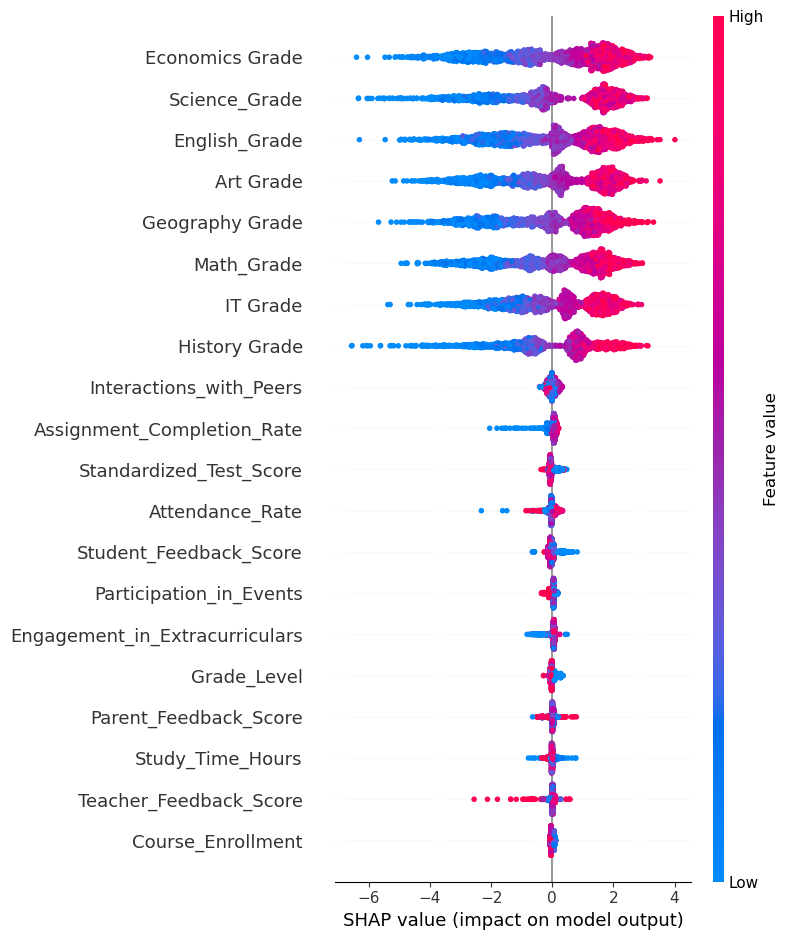

In [83]:
import shap


# Creating a SHAP explainer object
explainer = shap.Explainer(best_gb_model)

# Transforming the data for SHAP values
shap_values = explainer.shap_values(merged_data.iloc[:, :-1])

# Summary plot
shap.summary_plot(shap_values, merged_data.iloc[:, :-1], feature_names=merged_data.columns[:-1])
